<a href="https://colab.research.google.com/github/ScholarNikhil/Food/blob/main/food_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Calling the basic libraries for foodclassification system

In [ ]:
import os
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

warnings.filterwarnings("ignore")

In [ ]:
import tensorflow as tf
import tensorflow.keras.backend as K
from tensorflow.keras.preprocessing import image
from tensorflow.keras import models
from tensorflow.keras.models import load_model
from tensorflow.keras import models
from PIL import Image
from skimage.io import imread
import cv2

K.clear_session()

Mounting google drive with collab for accessing the data and saving result. If you are using idle module then you can comment out this section

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Reading the source image, reshaping dimensions and start processing array.

In [ ]:
img = plt.imread('/content/drive/MyDrive/FoodImage/ApplePie/A020511XX_02577.jpg') #upload the path of data to process
dims = np.shape(img)
matrix = np.reshape(img, (dims[0] * dims[1], dims[2]))
print(np.shape(matrix))

(4860000, 3)


Image shape ->  (1800, 2700)
Color channels ->  3
Min color depth : 0, Max color depth 255


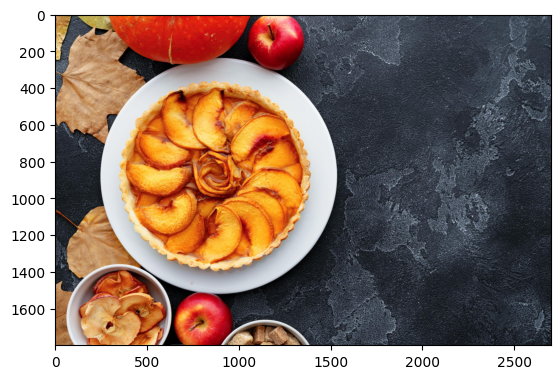

In [ ]:
plt.imshow(img)
print("Image shape -> ",dims[:2])
print("Color channels -> ",dims[2])
print("Min color depth : {}, Max color depth {}".format(np.min(img),np.max(img)))

Plotting pixel intensities in RGB color space

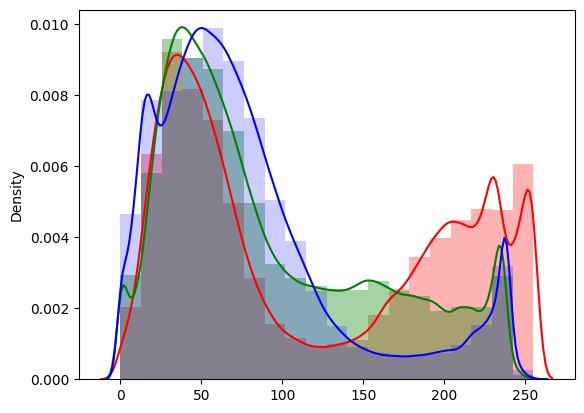

In [ ]:
sns.distplot(matrix[:,0], bins=20,color="red",hist_kws=dict(alpha=0.3))
sns.distplot(matrix[:,1], bins=20,color="green",hist_kws=dict(alpha=0.35))
sns.distplot(matrix[:,2], bins=20,color="blue",hist_kws=dict(alpha=0.2))
plt.show()

Histogram visualization for green and blue channels

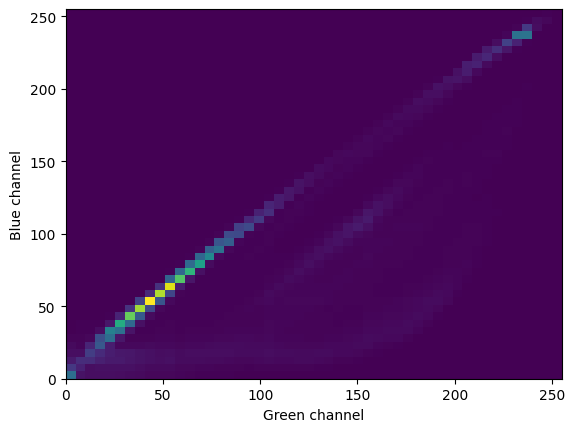

In [ ]:
_ = plt.hist2d(matrix[:,1], matrix[:,2], bins=(50,50))
plt.xlabel('Green channel')
plt.ylabel('Blue channel')
plt.show()

Cluster generation

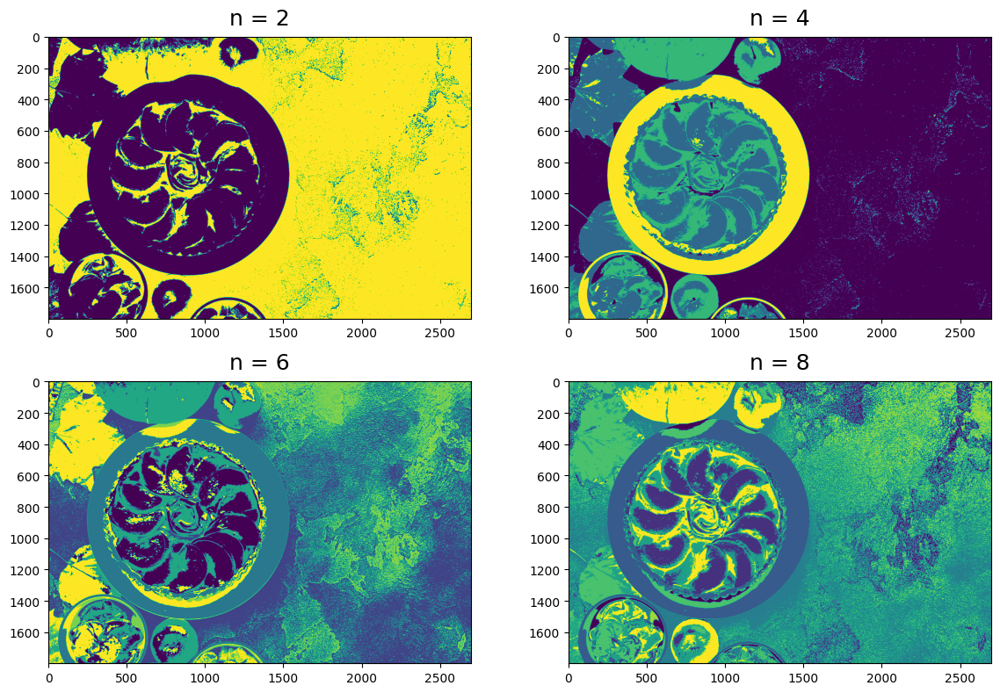

In [ ]:
from sklearn import cluster
n_vals=[2,4,6,8]
plt.figure(1, figsize=(12, 8))

for subplot,n in enumerate(n_vals):
    kmeans=cluster.KMeans(n)
    clustered = kmeans.fit_predict(matrix)
    dims = np.shape(img)
    clustered_img = np.reshape(clustered, (dims[0], dims[1]))
    plt.subplot(2,2, subplot+1)
    plt.title("n = {}".format(n), pad = 10,size=18)
    plt.imshow(clustered_img)

plt.tight_layout()

Plotting of channel intensity for each cluster

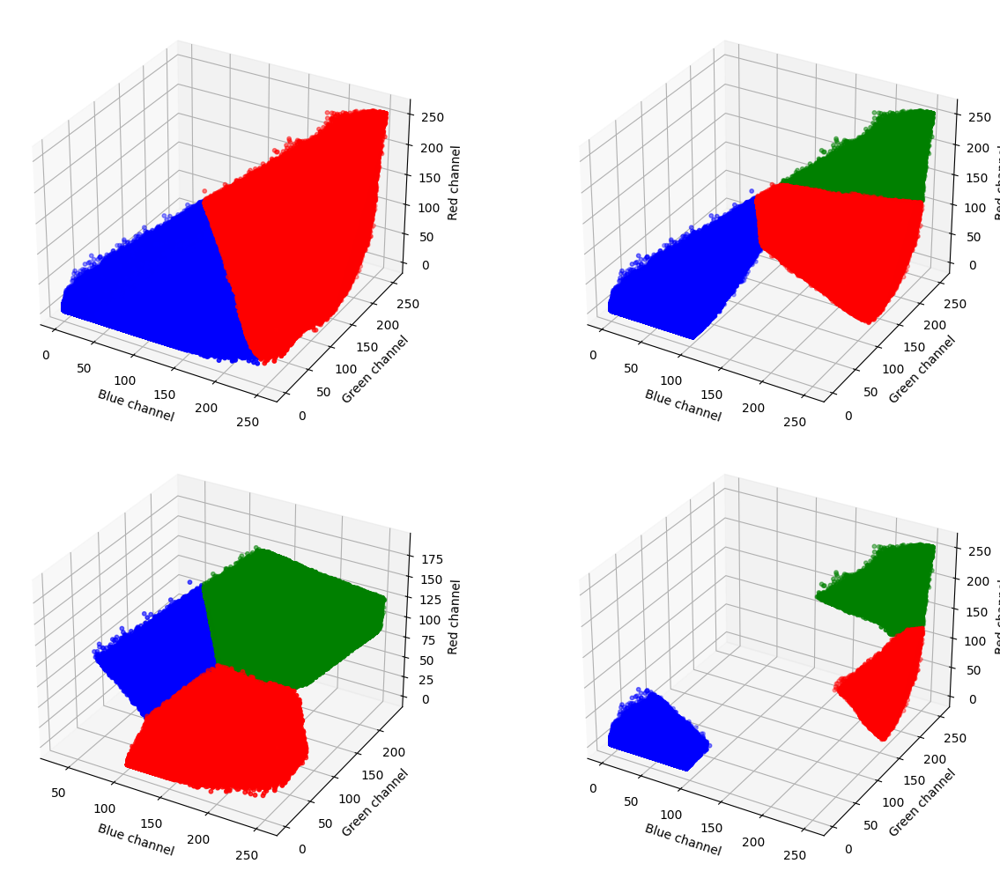

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig=plt.figure(figsize=(14,10))

ax = [fig.add_subplot(221, projection='3d'),
      fig.add_subplot(222, projection='3d'),
      fig.add_subplot(223, projection='3d'),
      fig.add_subplot(224, projection='3d')]

for plot_number,n in enumerate(n_vals):

    kmeans=cluster.KMeans(n)
    clustered = kmeans.fit_predict(matrix)
    x1, y1, z1 = [np.where(clustered == x)[0] for x in [0, 1, 2]]

    plot_vals = [('r', x1),
                 ('b', y1),
                 ('g', z1),
                 ]

    for c, channel in plot_vals:
        x = matrix[channel, 0]
        y = matrix[channel, 1]
        z = matrix[channel, 2]
        ax[plot_number].scatter(x, y, z, c=c,s=10)

    ax[plot_number].set_xlabel('Blue channel')
    ax[plot_number].set_ylabel('Green channel')
    ax[plot_number].set_zlabel('Red channel')

plt.tight_layout()

Applying brightness normalization (contrast or histogram stretching)

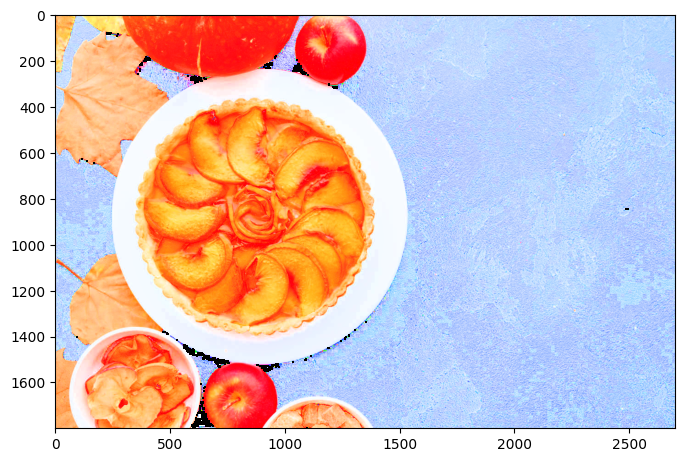

In [ ]:
bnorm = np.zeros_like(matrix, dtype=np.float32)
max_range = np.max(matrix, axis=1)
bnorm = matrix / np.vstack((max_range, max_range, max_range)).T
bnorm_img = np.reshape(bnorm, (dims[0],dims[1],dims[2]))
plt.figure(figsize=(8,10))
plt.imshow(bnorm_img)
plt.show()

Extracting image gradient using Sobel filter

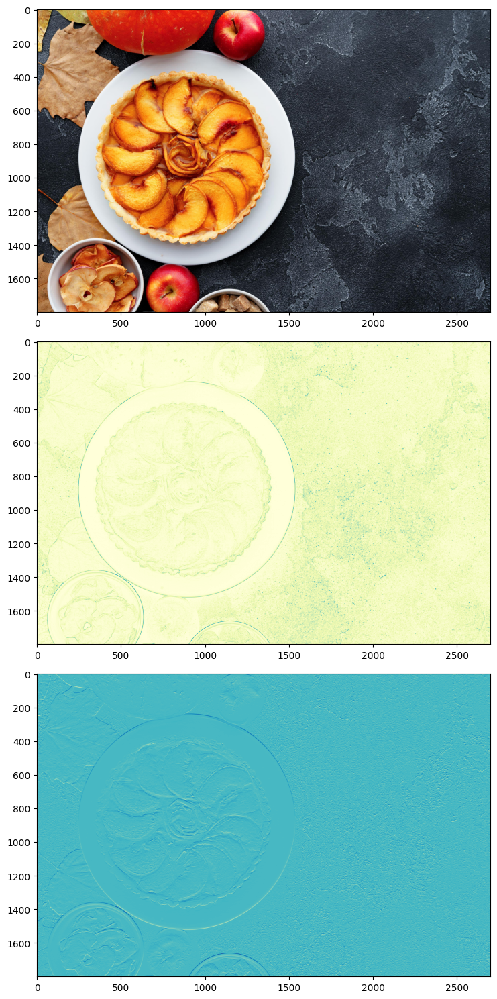

In [ ]:
import skimage
from skimage.feature import greycomatrix, greycoprops
from skimage.filters import sobel
from skimage.filters import sobel_h

plt.figure(1,figsize=(20,15))
cmap="YlGnBu"
plt.subplot(3,1,1)
plt.imshow(img)

plt.subplot(3,1,2)
plt.imshow(sobel(img[:,:,2]),cmap=cmap)

plt.subplot(3,1,3)
plt.imshow(sobel_h(img[:,:,1]), cmap=cmap)

plt.tight_layout()

Applying linear dimension reduction scheme 'PCA' for extracting information

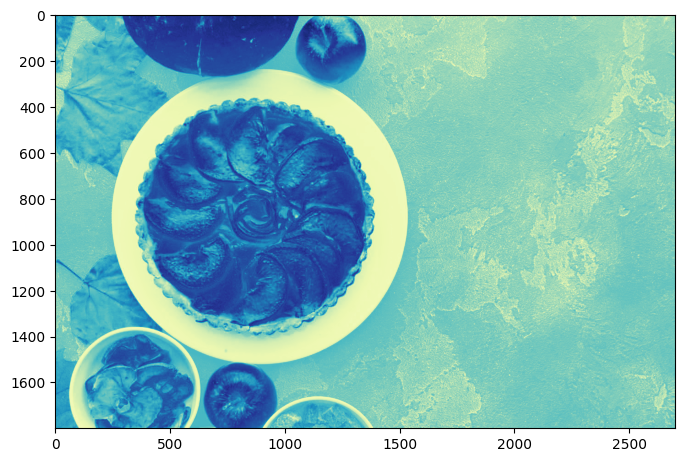

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(3)
pca.fit(matrix)
img_pca = pca.transform(matrix)
img_pca = np.reshape(img_pca, (dims[0], dims[1], dims[2]))

fig = plt.figure(figsize=(8, 8))
plt.imshow(img_pca[:,:,1], cmap=cmap)

Total number of image data present for each food item

/content/drive/MyDrive/FoodClassification/train/Bread
/content/drive/MyDrive/FoodClassification/train/Pork
/content/drive/MyDrive/FoodClassification/train/FriedRice
/content/drive/MyDrive/FoodClassification/train/Bibimbop
/content/drive/MyDrive/FoodClassification/train/BagelSandwich
/content/drive/MyDrive/FoodClassification/train/ApplePie


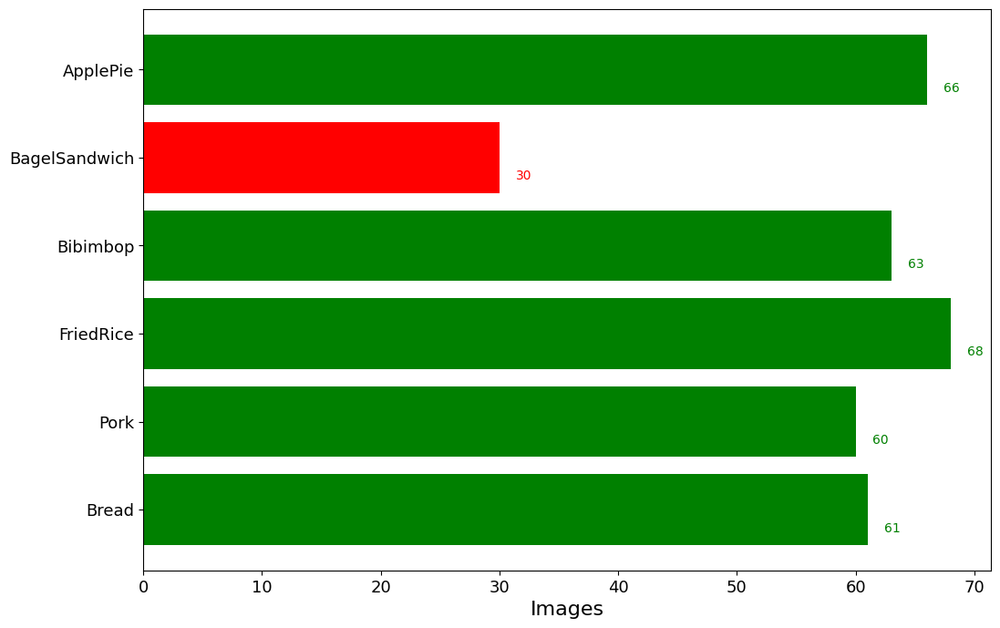

In [ ]:
main='/content/drive/MyDrive/FoodClassification/train'     #add path for training data

data=dict()

for i in os.listdir(main):
    sub_dir=os.path.join(main,i)
    print(sub_dir)
    count=len(os.listdir(sub_dir))
    data[i]=count


keys = data.keys()
values = data.values()

colors=["red" if x<= 50 else "green" for x in values]

fig, ax = plt.subplots(figsize=(12,8))
y_pos=np.arange(len(values))
plt.barh(y_pos,values,align='center',color=colors)
for i, v in enumerate(values):
    ax.text(v+1.4, i-0.25, str(v), color=colors[i])
ax.set_yticks(y_pos)
ax.set_yticklabels(keys)
ax.set_xlabel('Images',fontsize=16)
plt.xticks(color='black',fontsize=13)
plt.yticks(fontsize=13)
plt.show()

Randomly picking image from every class

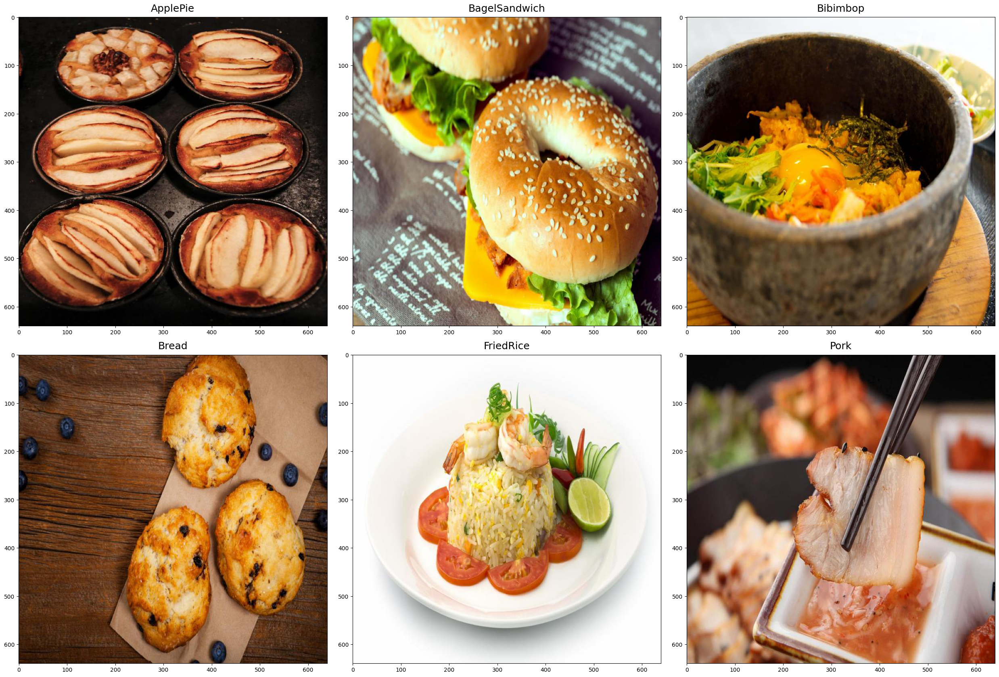

In [ ]:
import random

train_folder = "/content/drive/MyDrive/FoodClassification/train"         #add path for training data
images = []

for food_folder in sorted(os.listdir(train_folder)):
    food_items = os.listdir(train_folder + '/' + food_folder)
    food_selected = np.random.choice(food_items)
    images.append(os.path.join(train_folder,food_folder,food_selected))

fig=plt.figure(1, figsize=(25, 25))

for subplot,image_ in enumerate(images):
    category=image_.split('/')[-2]
    imgs = plt.imread(image_)
    a,b,c=imgs.shape
    fig=plt.subplot(3, 3, subplot+1)
    fig.set_title(category, pad = 10,size=18)
    plt.imshow(imgs)

plt.tight_layout()

Data augmentation

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

n_classes = 6
batch_size = 32
img_width, img_height = 299, 299

train_data_dir = '/content/drive/MyDrive/FoodClassification/train'          #add path for training data

#data augmentation
train_datagen = ImageDataGenerator(
    rescale=1. / 255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

val_data_dir = '/content/drive/MyDrive/FoodClassification/val'           #add path for validation data

val_datagen = ImageDataGenerator(rescale=1. / 255)

val_generator = val_datagen.flow_from_directory(
    val_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

Found 348 images belonging to 6 classes.
Found 99 images belonging to 6 classes.


In [ ]:
class_map = train_generator.class_indices
class_map

{'ApplePie': 0,
 'BagelSandwich': 1,
 'Bibimbop': 2,
 'Bread': 3,
 'FriedRice': 4,
 'Pork': 5}

In [ ]:
print(tf.__version__)
print(tf.test.gpu_device_name())

2.12.0



Model Trainig and saving

In [ ]:
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, ZeroPadding2D, GlobalAveragePooling2D, AveragePooling2D
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten

from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Dense, Dropout

from tensorflow.keras import regularizers
from tensorflow.keras.regularizers import l2

from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.callbacks import ModelCheckpoint, CSVLogger

nb_train_samples = 348
nb_validation_samples = 99

inception = InceptionV3(weights='imagenet', include_top=False)
x = inception.output
x = GlobalAveragePooling2D()(x)
x = Dense(128,activation='relu')(x)
x = Dropout(0.2)(x)

predictions = Dense(n_classes,kernel_regularizer=regularizers.l2(0.005), activation='softmax')(x)

model = Model(inputs=inception.input, outputs=predictions)
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='categorical_crossentropy', metrics=['accuracy'])
checkpointer = ModelCheckpoint(filepath='v1_inceptionV3', verbose=1, save_best_only=True)
csv_logger = CSVLogger('history_v1_inceptionV3.log')

history = model.fit_generator(train_generator,
                    steps_per_epoch = nb_train_samples // batch_size,
                    validation_data=val_generator,
                    validation_steps=nb_validation_samples // batch_size,
                    epochs=10,
                    verbose=1,
                    callbacks=[csv_logger, checkpointer])
model.save('trainedmodel')

Epoch 1/10
10/10 [==============================] - ETA: 0s - loss: 1.4867 - accuracy: 0.4399 
Epoch 1: val_loss improved from inf to 1.06039, saving model to v1_inceptionV3


10/10 [==============================] - 464s 46s/step - loss: 1.4867 - accuracy: 0.4399 - val_loss: 1.0604 - val_accuracy: 0.5521
Epoch 2/10
10/10 [==============================] - ETA: 0s - loss: 0.4541 - accuracy: 0.8892 
Epoch 2: val_loss did not improve from 1.06039
10/10 [==============================] - 402s 40s/step - loss: 0.4541 - accuracy: 0.8892 - val_loss: 1.1485 - val_accuracy: 0.6875
Epoch 3/10
10/10 [==============================] - ETA: 0s - loss: 0.1888 - accuracy: 0.9620 
Epoch 3: val_loss improved from 1.06039 to 0.91321, saving model to v1_inceptionV3


10/10 [==============================] - 427s 43s/step - loss: 0.1888 - accuracy: 0.9620 - val_loss: 0.9132 - val_accuracy: 0.7708
Epoch 4/10
10/10 [==============================] - ETA: 0s - loss: 0.1492 - accuracy: 0.9778 
Epoch 4: val_loss improved from 0.91321 to 0.54116, saving model to v1_inceptionV3


10/10 [==============================] - 421s 43s/step - loss: 0.1492 - accuracy: 0.9778 - val_loss: 0.5412 - val_accuracy: 0.8542
Epoch 5/10
10/10 [==============================] - ETA: 0s - loss: 0.1000 - accuracy: 0.9873 
Epoch 5: val_loss did not improve from 0.54116
10/10 [==============================] - 394s 40s/step - loss: 0.1000 - accuracy: 0.9873 - val_loss: 1.2618 - val_accuracy: 0.6771
Epoch 6/10
10/10 [==============================] - ETA: 0s - loss: 0.1093 - accuracy: 0.9778 
Epoch 6: val_loss did not improve from 0.54116
10/10 [==============================] - 394s 40s/step - loss: 0.1093 - accuracy: 0.9778 - val_loss: 1.0306 - val_accuracy: 0.7604
Epoch 7/10
10/10 [==============================] - ETA: 0s - loss: 0.1124 - accuracy: 0.9810 
Epoch 7: val_loss did not improve from 0.54116
10/10 [==============================] - 392s 40s/step - loss: 0.1124 - accuracy: 0.9810 - val_loss: 0.9617 - val_accuracy: 0.7083
Epoch 8/10
10/10 [==============================] 

Loss and accuracy curve

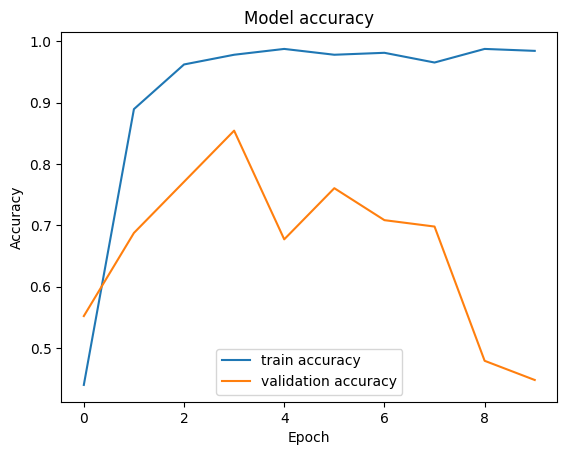

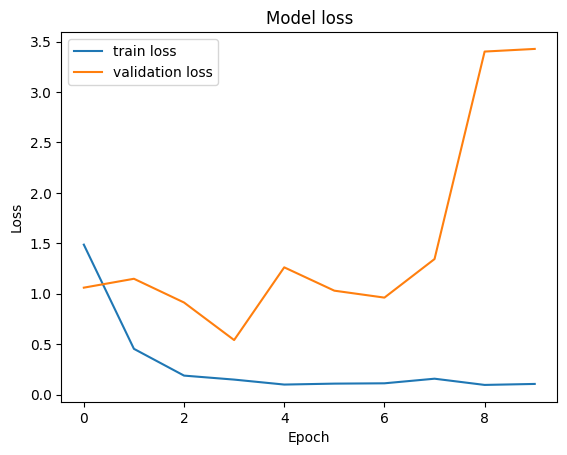

In [ ]:
def plot_accuracy(history):

    plt.plot(history.history['accuracy'],label='train accuracy')
    plt.plot(history.history['val_accuracy'],label='validation accuracy')
    plt.title('Model accuracy')
    plt.ylabel('Accuracy')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('AccuracyModel')
    plt.show()

def plot_loss(history):

    plt.plot(history.history['loss'],label="train loss")
    plt.plot(history.history['val_loss'],label="validation loss")
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='best')
    plt.savefig('LossModel')
    plt.show()

plot_accuracy(history)
plot_loss(history)

Prediction (Loading the model)

In [ ]:
K.clear_session()
path_to_model='./trainedmodel'
print("Loading the model..")
model = load_model(path_to_model)
print("Done!")

Loading the model..
Done!


Testing model on test set

In [ ]:
test_data_dir = '../content/drive/MyDrive/FoodClassification/test'      #add path for test data

test_datagen = ImageDataGenerator(rescale=1. / 255)

test_generator = test_datagen.flow_from_directory(
    test_data_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical')

Found 50 images belonging to 6 classes.


In [ ]:
scores = model.evaluate_generator(test_generator)

print("Test Accuracy: {:.3f}".format(scores[1]))

Test Accuracy: 0.380


In [ ]:
category={
    0: ['ApplePie','ApplePie'], 1: ['BagelSandwich','BagelSandwich'], 2: ['Bibimbop','Bibimbop'],
    3: ['Bread','Bread'], 4: ['FriedRice','FriedRice'], 5: ['Pork','Pork'],
}

def predict_image(filename,model):
    img_ = image.load_img(filename, target_size=(299, 299))
    img_array = image.img_to_array(img_)
    img_processed = np.expand_dims(img_array, axis=0)
    img_processed /= 255.

    prediction = model.predict(img_processed)

    index = np.argmax(prediction)

    plt.title("Prediction - {}".format(category[index][1]))
    plt.imshow(img_array)

def predict_dir(filedir,model):
    cols=5
    pos=0
    images=[]
    total_images=len(os.listdir(filedir))
    rows=total_images//cols + 1

    true=filedir.split('/')[-1]

    fig=plt.figure(1, figsize=(25, 25))

    for i in sorted(os.listdir(filedir)):
        images.append(os.path.join(filedir,i))

    for subplot,imggg in enumerate(images):
        img_ = image.load_img(imggg, target_size=(299, 299))
        img_array = image.img_to_array(img_)

        img_processed = np.expand_dims(img_array, axis=0)

        img_processed /= 255.
        prediction = model.predict(img_processed)
        index = np.argmax(prediction)

        pred=category.get(index)[0]
        if pred==true:
            pos+=1

        fig=plt.subplot(rows, cols, subplot+1)
        fig.set_title(category.get(index)[1], pad = 10,size=18)
        plt.imshow(img_array)

    acc=pos/total_images
    print("Accuracy of Test : {:.2f} ({pos}/{total})".format(acc,pos=pos,total=total_images))
    plt.tight_layout()

Single image prediction

Load the image path here for model prediction.

Instuction to add the image.
Step1: Download the directory and upload it to your drive
Step2: now mount the drive with your google colab to access the model.
Step3: Upload the desired dataset too
Step 4: Now copy its path and enter it in preict_image('path') as shown below to test for different images.

Note: This model is trained for six classes and on a small dataset, hence it shows result for those six classes only. Also it can mis-classify under certain circumstances. Example- there are possibilities that it cannot classify between food items such as meat, pork, chicken etc.

1/1 [==============================] - 2s 2s/step


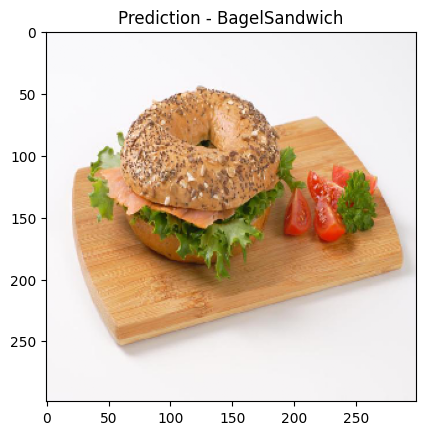

In [ ]:
predict_image('../content/drive/MyDrive/FoodClassification/test/BagelSandwich/B020411XX_11165_jpg.rf.d275b16c520bc6563b8f3370cccef918.jpg',model)

#add path for single test image

Predicting Category

If you want to test the model for a large data you can upload a complete folder and provide its path down below. Through which you can check the accuracy of the scheme.

1/1 [==============================] - 0s 273ms/step
Accuracy of Test : 0.86 (6/7)


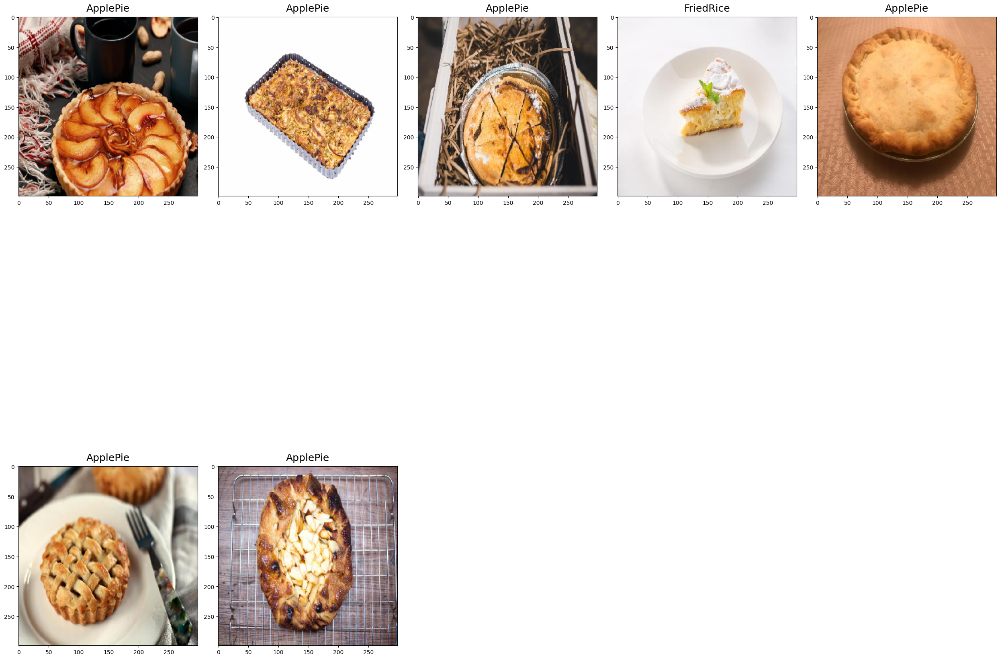

In [ ]:
predict_dir("/content/drive/MyDrive/FoodClassification/test/ApplePie",model)     #add path for testing image folder

The model is well trained and gives desired output. The used model uses transfer learning scheme to train the model. For further parameter visualization confusion matrix can also be plotted but I have skipped that part for now. As the problem statement focuses on food classification.